# Stock Market Exploratory Data Analysis (EDA)

## Purpose
This phase of the project focuses on conducting an in-depth exploratory data analysis (EDA) of the selected stock. The goal is to extract valuable insights and explore key statistics that will lay the foundation for building a robust stock market forecasting system capable of providing actionable recommendations—Buy, Sell, or Hold.
### 1.0 Load Data and Calculate Key Statistics

In [70]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import mplfinance as mpf
import plotly.graph_objects as go


company_df = pd.read_csv('data/sp500_companies.csv')
stock_df = pd.read_csv('data/sp500_stocks.csv')


In [71]:

# Assuming stock_df is your DataFrame
stock_df['Date'] = pd.to_datetime(stock_df['Date'])

stock_df['MA_10'] = stock_df.groupby('Symbol')['Close'].rolling(window=10).mean().reset_index(level=0, drop=True)
stock_df['MA_20'] = stock_df.groupby('Symbol')['Close'].rolling(window=20).mean().reset_index(level=0, drop=True)
stock_df['MA_50'] = stock_df.groupby('Symbol')['Close'].rolling(window=50).mean().reset_index(level=0, drop=True)
stock_df['MA_200'] = stock_df.groupby('Symbol')['Close'].rolling(window=200).mean().reset_index(level=0, drop=True)
stock_df['std_10'] = stock_df.groupby('Symbol')['Close'].rolling(window=10).std().reset_index(level=0, drop=True)
stock_df['std_20'] = stock_df.groupby('Symbol')['Close'].rolling(window=20).std().reset_index(level=0, drop=True)
stock_df['std_50'] = stock_df.groupby('Symbol')['Close'].rolling(window=50).std().reset_index(level=0, drop=True)
stock_df['std_200'] = stock_df.groupby('Symbol')['Close'].rolling(window=200).std().reset_index(level=0, drop=True)


In [72]:

stock_df['upper_band_10'] = stock_df['MA_10'] + (stock_df['std_10'] * 2)
stock_df['lower_band_10'] = stock_df['MA_10'] - (stock_df['std_10'] * 2)

stock_df['upper_band_20'] = stock_df['MA_20'] + (stock_df['std_20'] * 2)
stock_df['lower_band_20'] = stock_df['MA_20'] - (stock_df['std_20'] * 2)

stock_df['upper_band_50'] = stock_df['MA_50'] + (stock_df['std_50'] * 2)
stock_df['lower_band_50'] = stock_df['MA_50'] - (stock_df['std_50'] * 2)


stock_df['upper_band_200'] = stock_df['MA_200'] + (stock_df['std_200'] * 2)
stock_df['lower_band_200'] = stock_df['MA_200'] - (stock_df['std_200'] * 2)

In [73]:
stock_df['Golden_Cross_Short'] = np.where((stock_df['MA_10'] > stock_df['MA_20']) & (stock_df['MA_10'].shift(1) <= stock_df['MA_20'].shift(1)), 1, 0)
stock_df['Golden_Cross_Medium'] = np.where((stock_df['MA_20'] > stock_df['MA_50']) & (stock_df['MA_20'].shift(1) <= stock_df['MA_50'].shift(1)), 1, 0)
stock_df['Golden_Cross_Long'] = np.where((stock_df['MA_50'] > stock_df['MA_200']) & (stock_df['MA_50'].shift(1) <= stock_df['MA_200'].shift(1)), 1, 0)

stock_df['Death_Cross_Short'] = np.where((stock_df['MA_10'] < stock_df['MA_20']) & (stock_df['MA_10'].shift(1) >= stock_df['MA_20'].shift(1)), 1, 0)
stock_df['Death_Cross_Medium'] = np.where((stock_df['MA_20'] < stock_df['MA_50']) & (stock_df['MA_20'].shift(1) >= stock_df['MA_50'].shift(1)), 1, 0)
stock_df['Death_Cross_Long'] = np.where((stock_df['MA_50'] < stock_df['MA_200']) & (stock_df['MA_50'].shift(1) >= stock_df['MA_200'].shift(1)), 1, 0)

In [74]:

stock_df['Z-score'] = (stock_df['Close'] - stock_df['Close'].mean()) / stock_df['Close'].std()
stock_df['Daily Return'] = stock_df.groupby('Symbol')['Close'].pct_change(fill_method=None).reset_index(level=0, drop=True)
company_df.fillna(0, inplace=True)
stock_df.fillna(0, inplace=True)
stock_df

,Date,Symbol,Adj Close,Close,High,Low,Open,Volume,MA_10,MA_20,...,upper_band_200,lower_band_200,Golden_Cross_Short,Golden_Cross_Medium,Golden_Cross_Long,Death_Cross_Short,Death_Cross_Medium,Death_Cross_Long,Z-score,Daily Return
0,2010-01-04,MMM,44.016720,69.414719,69.774246,69.122070,69.473244,3640265.0,0.000000,0.000000,...,0.000000,0.000000,0,0,0,0,0,0,-0.164107,0.000000
1,2010-01-05,MMM,43.741032,68.979935,69.590302,68.311035,69.230766,3405012.0,0.000000,0.000000,...,0.000000,0.000000,0,0,0,0,0,0,-0.166190,-0.006264
2,2010-01-06,MMM,44.361351,69.958191,70.735786,69.824417,70.133781,6301126.0,0.000000,0.000000,...,0.000000,0.000000,0,0,0,0,0,0,-0.161504,0.014182
3,2010-01-07,MMM,44.393173,70.008362,70.033447,68.662209,69.665550,5346240.0,0.000000,0.000000,...,0.000000,0.000000,0,0,0,0,0,0,-0.161263,0.000717
4,2010-01-08,MMM,44.705986,70.501671,70.501671,69.648827,69.974915,4073337.0,0.000000,0.000000,...,0.000000,0.000000,0,0,0,0,0,0,-0.158900,0.007046
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1864113,2024-09-18,ZTS,196.479996,196.479996,198.389999,194.369995,196.800003,1993800.0,191.714000,187.348000,...,204.763765,155.056936,0,0,0,0,0,0,0.444592,0.003934
1864114,2024-09-19,ZTS,193.240005,193.240005,200.330002,191.309998,198.229996,2463100.0,192.379001,187.865001,...,204.905415,155.056386,0,0,0,0,0,0,0.429071,-0.016490
1864115,2024-09-20,ZTS,192.639999,192.639999,194.550003,191.070007,192.940002,3520700.0,192.720001,188.388501,...,205.020486,155.046515,0,0,0,0,0,0,0.426197,-0.003105
1864116,2024-09-23,ZTS,193.589996,193.589996,193.660004,191.080002,192.809998,1315700.0,192.906001,189.023001,...,205.163548,155.042853,0,0,0,0,0,0,0.430748,0.004931


In [75]:
stock_df.columns

Index(['Date', 'Symbol', 'Adj Close', 'Close', 'High', 'Low', 'Open', 'Volume',
       'MA_10', 'MA_20', 'MA_50', 'MA_200', 'std_10', 'std_20', 'std_50',
       'std_200', 'upper_band_10', 'lower_band_10', 'upper_band_20',
       'lower_band_20', 'upper_band_50', 'lower_band_50', 'upper_band_200',
       'lower_band_200', 'Golden_Cross_Short', 'Golden_Cross_Medium',
       'Golden_Cross_Long', 'Death_Cross_Short', 'Death_Cross_Medium',
       'Death_Cross_Long', 'Z-score', 'Daily Return'],
      dtype='object')

### Visualize Data
#### Line Chart of Closing Price

In [76]:
alt.data_transformers.disable_max_rows()
def plot_closing_price(df, company):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_line().encode(
        alt.X('Date:T', title='Date'),
        alt.Y('Close:Q', title='Closing Price'),
        alt.Tooltip(['Date:T', 'Close:Q', 'Volume:Q'])
    ).properties(
        title=f'{company} Closing Price',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )
    return chart
plot_closing_price(stock_df, 'AMD')

alt.Chart(...)

This graph of the closing prices over time allowing us to see the relative trents that AMD has previously had. We can see an upward trend from 2010 until around 2022, this can likely be explained by the pandemic effecting the market as a whole. We can see that toward the end of 2022 another upward trend begins until around Q2 in 2024. 
#### CandleStick Chart

In [83]:

def plot_candlestick(df, company,window:list = None):
    filtered_df = df[df['Symbol'] == company]
    filtered_df = filtered_df[filtered_df['Date'] >= window[0]]
    filtered_df = filtered_df[filtered_df['Date'] <= window[1]]
    filtered_df['Date'] = pd.to_datetime(filtered_df['Date'])
    df = filtered_df
    candlestick = go.Candlestick(
        x=df['Date'],
        open=df['Open'],
        high=df['High'],
        low=df['Low'],
        close=df['Close'],
        name='Candlestick'
        )
    
    volume = go.Bar(
        x=df['Date'],
        y=df['Volume'],
        name='Volume',
        marker_color='blue',
        opacity=0.5,
        yaxis='y2'
    )

    layout = go.Layout(
        title= f'{company} Candlestick Chart From {window[0]} to {window[1]}',
        xaxis=dict(title='Date'),
        yaxis=dict(title='Price', showgrid=True),
        yaxis2=dict(title='Volume', overlaying='y', side='right', showgrid=False),
        xaxis_rangeslider_visible=False,
        hovermode='x unified',
        plot_bgcolor='white'
    )

    fig = go.Figure(
        data=[candlestick, volume],
        layout=layout
        )
    fig.show()
plot_candlestick(stock_df, 'AMD', window=['2024-07-01', '2024-10-01'])

This Candlestick chart allows us to see daily price movement of the stock (open, high, low, close) and other patterns to help predict future price. If we Zoom in on points where the stock trend changes we can see patterns the candlesticks reveal such as engulfing candles where the body of one candle is larger than the entire previous candle indicating which could help comfirm an exsisting trend or suggest a new one. 

In [78]:
def plot_moving_average(df, company, color, MA,term):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_line(color=color).encode(
        alt.X('Date:T', title='Date'),
        alt.Y(f'{MA}:Q', title='{MA}'),
        alt.Tooltip(['Date', 'Close:Q', 'Volume:Q',MA, 'Death_Cross_Short:O', 'Golden_Cross_Short:O', 'Death_Cross_Long:O', 'Golden_Cross_Long:O'])
    ).properties(
        title=f'{company} Moving Average {term}',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )

    
    return chart
MA_10 = plot_moving_average(stock_df, 'AMD', 'green', 'MA_10','Short Term')
MA_20 = plot_moving_average(stock_df, 'AMD', 'blue', 'MA_20','Short Term')
MA_50 = plot_moving_average(stock_df, 'AMD', 'red', 'MA_50','Long Term')
MA_200 = plot_moving_average(stock_df, 'AMD', 'purple', 'MA_200','Long Term')
short_term_MA = alt.layer(MA_10, MA_20)
medium_term_MA = alt.layer(MA_200, MA_50)
MA_charts = alt.vconcat(short_term_MA, medium_term_MA)
MA_charts

alt.VConcatChart(...)

These charts are of the short term and long term moving averages. The top chart has the 10 moving average in green and the 20 day moving average in blue. When the 20 day average crosses below the 10 day average it indicates a possible short term dip, and if the short term crosses above the long term it indicates a possible short term rise. This logic can also be applied to the long term moving averages allowing us to gauge and make an educated guess on stock movement over time. 

In [79]:

def plot_daily_return(df, company):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_bar().encode(
        alt.X('Date:T', title='Date'),
        alt.Y('Daily Return:Q', title='Daily Return'),
        alt.Color('Daily Return:Q', scale=alt.Scale(scheme='redblue')),
        alt.Tooltip(['Date:T', 'Close:Q', 'Volume:Q', 'Daily Return:Q'], format='.2f')
    ).properties(
        title=f'{company} Daily Return',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )
    return chart
plot_daily_return(stock_df, 'AMD')

alt.Chart(...)

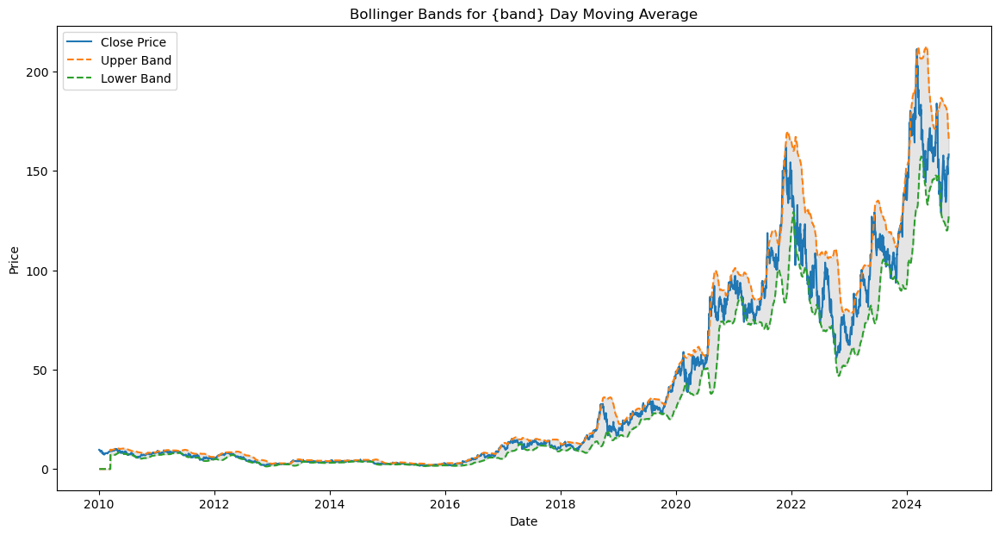

In [84]:
def plot_bollinger_bands(df, company,band):
    df = df[df['Symbol'] == company]
    plt.figure(figsize=(14, 7))
    plt.plot(df['Date'], df['Close'], label='Close Price')
    plt.plot(df['Date'], df[f'upper_band_{band}'], label='Upper Band', linestyle='--')
    plt.plot(df['Date'], df[f'lower_band_{band}'], label='Lower Band', linestyle='--')
    plt.fill_between(df['Date'], df[f'upper_band_{band}'], df[f'lower_band_{band}'], color='gray', alpha=0.2)
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title('Bollinger Bands for {band} Day Moving Average')
    plt.legend()
    plt.show()
band_50 = plot_bollinger_bands(stock_df, 'AMD',50)

In [81]:
def plot_Z_score(df, company):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_line().encode(
        alt.X('Date:T', title='Date'),
        alt.Y('Z-score:Q', title='Z-score'),
        alt.Tooltip(['Date:T', 'Close:Q', 'Volume:Q', 'Z-score:Q'], format='.2f')
    ).properties(
        title=f'{company} Z-score',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )
    return chart
plot_Z_score(stock_df, 'AAPL')

alt.Chart(...)

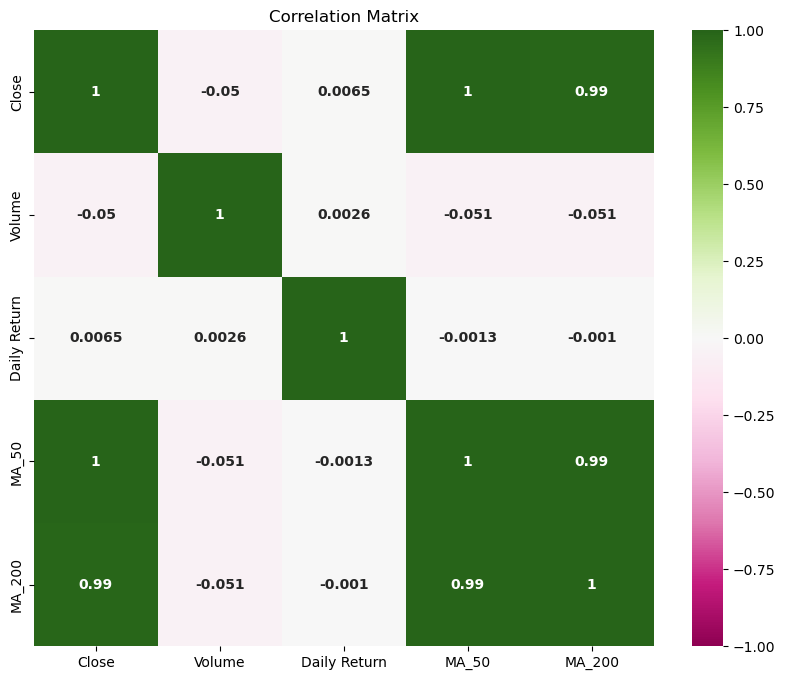

In [82]:
def plot_correlation_matrix(df, company):
    columns_of_interest = ['Close', 'Volume', 'Daily Return', 'MA_50', 'MA_200']
    correlation_matrix = df[columns_of_interest].corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        correlation_matrix, 
        annot=True, 
        cmap='PiYG', 
        vmin=-1, 
        vmax=1, 
        annot_kws={"size": 10, "weight": "bold"}  
        )
    plt.title('Correlation Matrix')
    plt.show()
plot_correlation_matrix(stock_df, 'AAPL')